# Fiji Earthquakes — Interactive South Pacific Map in R

This is a continuation of [Fiji Earthquakes — South Pacific Orthographic Projection](). The objective is still the same — produce a high quality map using the `quakes` dataset, filtered to earthquakes above the 75th percentile in magnitude. However, due to most of the information being lost on a normal plot, in this section we will render the map as an interactive HTML widget. 

The right tool to use for an interactive map on R is `{leaflet}`. This package renders an HTML widget inline. We can also combine it with `{plotly}` for tooltip-rich ggplot2 maps, but that is work for another day. 

The map we will make uses `{leaflet}` for interaction (hover, zoom, pan) and `{ggplot2}` + `{ggiraph}` for a static companion panel showing the magnitude–depth distribution with linked tooltips. I have outline the workflow below:

### Workflow

1. Options & libraries
2. Data preparation  — quakes + island nations
3. Basemap polygons  — `{rnaturalearthhires}`
4. Colour & style    — custom palette, popup HTML
5. Leaflet map       — interactive globe with hover tooltips
6. Static companion  — ggplot2 magnitude / depth scatter

Install these packages if you have not yet installed them:

In [ ]:
install.packages("leaflet")
install.packages("htmltools")
install.packages("htmlwidgets")
remotes::install_github("trafficonese/leaflet.extras")

### Notebook display options

These affect how plots render inside the Jupyter R kernel.

In [3]:
options(
  repr.plot.width  = 11,
  repr.plot.height = 8,
  repr.plot.res    = 200
)

### Load libraries and data

`quakes` is bundled with base R.  It records 1000 seismic events near Fiji since 1964.  Columns: **lat**, **long**, **depth (km)**, **mag**, **stations**.

Longitudes in `quakes` are in the 0–360 range (e.g. 181.6 instead of -178.4). Leaflet expects -180 to 180, so we will have to wrap them early in this section. 

In [2]:
library(tidyverse)          # Core data wrangling + ggplot2
library(sf)                 # Simple-features spatial objects
library(rnaturalearth)      # Country polygons
library(rnaturalearthdata)  # Data companion for rnaturalearth
library(rnaturalearthhires) # High-resolution country polygons
library(leaflet)            # Interactive HTML map widget
library(htmltools)          # HTML tag helpers for popup content
library(scales)             # Colour scale utilities

In [4]:
data(quakes)

MagThreshold <- quantile(quakes$mag, probs = 0.75)

In [5]:
Quakes_Filtered <- quakes %>%
  filter(mag >= MagThreshold) %>%
  mutate(
    # Wrap longitudes from 0–360 into -180 to 180
    lon_wrap = if_else(long > 180, long - 360, long),

    # Hover tooltip — HTML string rendered by leaflet on mouse-enter
    hover_label = paste0(
      "<b style='font-size:13px'>Magnitude ", mag, "</b><br>",
      "Depth: ",     depth,    " km<br>",
      "Stations: ",  stations, "<br>",
      "<span style='color:#90a4ae;font-size:11px'>",
      abs(lat), if_else(lat < 0, "°S", "°N"), ", ",
      abs(lon_wrap), if_else(lon_wrap < 0, "°W", "°E"),
      "</span>"
    )
  )

### Island nation capitals
Five South Pacific sovereign states. Coordinates are for the capital city so the marker lands on land and the label is geographically meaningful.

In [6]:
IslandNations <- data.frame(
  nation  = c("Fiji",       "Vanuatu",    "Solomon Islands", "Samoa",      "Tonga"),
  capital = c("Suva",       "Port Vila",  "Honiara",         "Apia",       "Nukualofa"),
  lat     = c(-18.1416,     -17.7334,     - 9.4456,          -13.8314,     -21.1394),
  lon     = c( 178.4419,     168.3273,     159.9729,          -171.8320,   -175.2166),
  stringsAsFactors = FALSE
)

### Nation capital popup HTML 

We build a styled HTML string for each capital marker popup so it fits the dark aesthetic of the map tile we chose.

In [7]:
# Build the hover label for each nation row
IslandNations$hover_label <- paste0(
  "<b style='font-size:13px;color:#f48fb1'>", IslandNations$nation, "</b><br>",
  "<span style='color:#b0bec5'>Capital: </span>", IslandNations$capital, "<br>",
  "<span style='color:#78909c;font-size:11px'>",
  abs(IslandNations$lat),
  ifelse(IslandNations$lat < 0, "°S", "°N"), ",  ",
  abs(IslandNations$lon),
  ifelse(IslandNations$lon < 0, "°W", "°E"),
  "</span>"
)

### World polygons (high resolution)

We use the `large` scale from `{rnaturalearthhires}` for crisp coastlines when we zoom in. `st_make_valid()` guards against any geometry errors.

In [8]:
WorldHires_Sf <- ne_countries(scale = "large", returnclass = "sf") %>%
  st_make_valid()

### Colour palette 

A yellow → amber → red → crimson gradient maps low-to-high magnitude. 

Using `colorNumeric()` from `{leaflet}` ties the scale directly to the data range so that the mapping is always data-driven, not hard-coded.

In [9]:
MagPalette <- colorNumeric(
  palette = c("#fff176", "#ffb300", "#ff6f00", "#d50000", "#880e4f"),
  domain  = range(Quakes_Filtered$mag)
)

Radius scale: we map magnitude to pixel radius with a simple power function so that large events are visually dominant without dwarfing small ones.

In [10]:
mag_to_radius <- function(mag) {
  rescale(mag ^ 2.2,
          from = range(Quakes_Filtered$mag ^ 2.2),
          to   = c(4, 18))
}

### Build the interactive Leaflet map

Layer order (bottom to top):

1. Dark tile basemap
2. Country polygons (subtle fill, for geographic context)
3. Earthquake circles  — labelled on hover
4. Nation capital markers  — labelled on hover + clickable popup
5. Legend

Key leaflet interaction decisions:

- label      = tooltip shown on HOVER  (appears immediately, no click)
- popup      = richer content shown on CLICK
- `labelOptions(permanent = FALSE)` keeps hover labels clean and transient

In [11]:
FijiMap <- leaflet(options = leafletOptions(
  worldCopyJump = FALSE,
  zoomControl   = TRUE,
  minZoom       = 3,
  maxZoom       = 12
)) %>%

  # Dark tile — deep-ocean aesthetic, low visual noise
  addProviderTiles(
    providers$CartoDB.DarkMatter,
    options = providerTileOptions(opacity = 0.95)
  ) %>%

  # Start centred on Fiji
  setView(lng = 178, lat = -20, zoom = 5) %>%

  # Country polygons — using WorldHires_Sf (sf object, formula not needed)
  addPolygons(
    data         = WorldHires_Sf,
    fillColor    = "#1b4332",
    fillOpacity  = 0.35,
    color        = "#40916c",
    weight       = 0.6,
    opacity      = 0.5,
    smoothFactor = 1.5,
    group        = "Countries"
  ) %>%

  # Earthquake circles
  # lng and lat use ~ formula syntax against Quakes_Filtered which IS a plain df
  addCircleMarkers(
    data        = Quakes_Filtered,
    lng         = ~lon_wrap,
    lat         = ~lat,
    radius      = ~mag_to_radius(mag),
    color       = ~MagPalette(mag),
    fillColor   = ~MagPalette(mag),
    fillOpacity = 0.78,
    opacity     = 0.35,
    weight      = 1,
    stroke      = TRUE,
    label       = ~lapply(hover_label, HTML),
    labelOptions = labelOptions(
      style = list(
        "background-color" = "#0a0f1e",
        "color"            = "#eceff1",
        "border"           = "1px solid #f48fb1",
        "border-radius"    = "6px",
        "padding"          = "8px 12px",
        "font-family"      = "sans-serif",
        "font-size"        = "13px",
        "box-shadow"       = "0 2px 10px rgba(0,0,0,0.6)"
      ),
      direction = "auto",
      permanent = FALSE,   # Tooltip disappears on mouse-leave — never sticky
      textOnly  = FALSE
    ),
    popup        = ~lapply(hover_label, HTML),
    popupOptions = popupOptions(maxWidth = 230),
    group        = "Earthquakes"
  ) %>%

  # Nation capital markers
  # IslandNations is a plain data.frame — no sf conversion needed,
  # formula ~lon and ~lat resolve correctly against it.
  addCircleMarkers(
    data        = IslandNations,
    lng         = ~lon,
    lat         = ~lat,
    radius      = 7,
    color       = "#f48fb1",
    fillColor   = "white",
    fillOpacity = 1,
    opacity     = 1,
    weight      = 2.5,
    stroke      = TRUE,
    label       = ~lapply(hover_label, HTML),
    labelOptions = labelOptions(
      style = list(
        "background-color" = "#0a0f1e",
        "color"            = "#f48fb1",
        "border"           = "1px solid #f48fb1",
        "border-radius"    = "5px",
        "padding"          = "5px 10px",
        "font-family"      = "sans-serif",
        "font-size"        = "12px",
        "font-weight"      = "bold"
      ),
      direction = "top",
      permanent = FALSE
    ),
    popup        = ~lapply(hover_label, HTML),
    popupOptions = popupOptions(maxWidth = 230),
    group        = "Island Nations"
  ) %>%

  # Magnitude colour legend
  addLegend(
    position  = "bottomright",
    pal       = MagPalette,
    values    = Quakes_Filtered$mag,
    title     = "Magnitude",
    opacity   = 0.9,
    labFormat = labelFormat(digits = 1)
  ) %>%

  # Layer toggle — lets user show/hide earthquakes and nation markers
  addLayersControl(
    overlayGroups = c("Earthquakes", "Island Nations"),
    options       = layersControlOptions(collapsed = FALSE)
  ) %>%

  addScaleBar(position = "bottomleft")

### Display the map 

Again with the long code. Imagine if it ends up looking really bad...

Anyway, let us now see how our map turned out. In a Jupyter R kernel, calling the object directly renders the widget inline.

In [12]:
FijiMap

HTML widgets cannot be represented in plain text (need html)

### Static companion — magnitude vs depth scatter

Gives distributional context for the filtered events.

In [13]:
MagDepthPlot <- Quakes_Filtered %>%
  ggplot(aes(x = depth, y = mag, colour = mag)) +
  geom_point(aes(size = mag), alpha = 0.65, shape = 16) +
  geom_smooth(
    method    = "loess",
    formula   = y ~ x,
    colour    = "#80cbc4",
    fill      = "#80cbc433",
    linewidth = 0.8,
    se        = TRUE
  ) +
  scale_colour_gradientn(
    colours = c("#fff176", "#ffb300", "#ff6f00", "#d50000", "#880e4f"),
    name    = "Magnitude"
  ) +
  scale_size_continuous(range = c(1, 5), guide = "none") +
  scale_x_continuous(labels = label_comma(suffix = " km")) +
  labs(
    title    = "Magnitude vs Focal Depth — Filtered Fiji Earthquakes",
    subtitle = paste0(nrow(Quakes_Filtered), " events  ·  magnitude ≥ ",
                      MagThreshold, " (75th percentile)"),
    x        = "Focal depth (km)",
    y        = "Magnitude",
    caption  = "Data: R built-in `quakes` dataset  ·  Trend line: LOESS smoother"
  ) +
  theme_minimal(base_family = "sans") +
  theme(
    plot.background  = element_rect(fill = "#070b1a", colour = NA),
    panel.background = element_rect(fill = "#070b1a", colour = NA),
    panel.grid.major = element_line(colour = "#ffffff12", linewidth = 0.3),
    panel.grid.minor = element_blank(),
    panel.border     = element_rect(colour = "#ffffff18", fill = NA, linewidth = 0.5),
    plot.title       = element_text(colour = "#eceff1", face = "bold", size = 14),
    plot.subtitle    = element_text(colour = "#78909c", size = 10),
    plot.caption     = element_text(colour = "#546e7a", size = 8),
    axis.text        = element_text(colour = "#90a4ae"),
    axis.title       = element_text(colour = "#b0bec5"),
    legend.background = element_rect(fill = "#070b1a", colour = NA),
    legend.text      = element_text(colour = "#b0bec5"),
    legend.title     = element_text(colour = "#eceff1"),
    plot.margin      = margin(14, 16, 12, 14)
  )

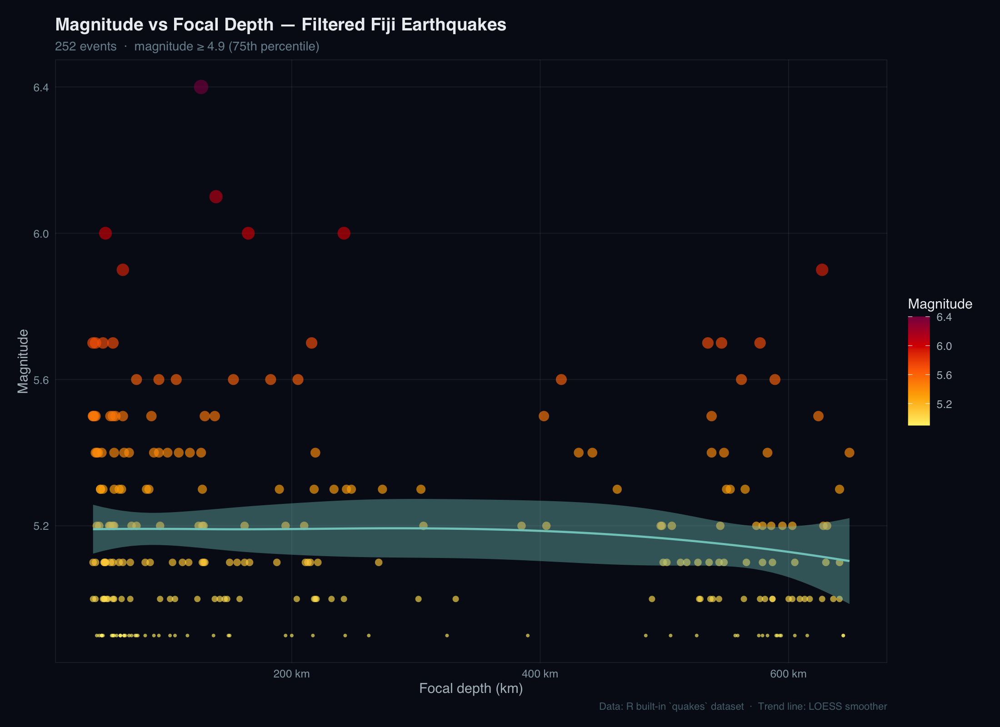

In [14]:
print(MagDepthPlot)

And there we have our map and a bonus figure. This marks the end of the mapping interactive maps section.